## Importing the Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import show
import seaborn as sns
import folium
from folium.plugins import HeatMap

## Importing the Dataset

In [2]:
df = pd.read_csv('Data-Collisions.csv')

C:\Users\DEBASHRITA\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


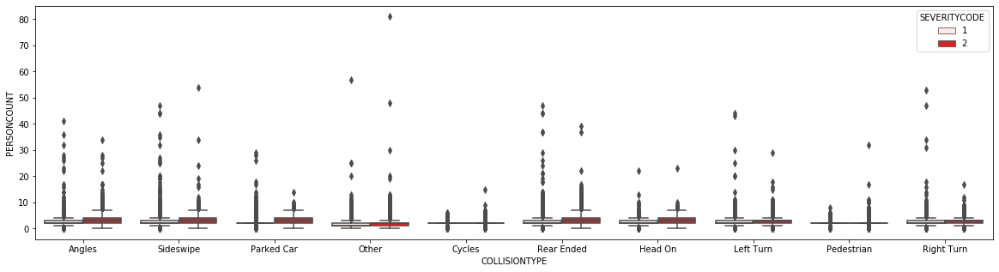

In [4]:
plt.figure(figsize=(20,5))
ax = sns.boxplot(x="COLLISIONTYPE", y="PERSONCOUNT", hue="SEVERITYCODE",
                 data=df, color="red")

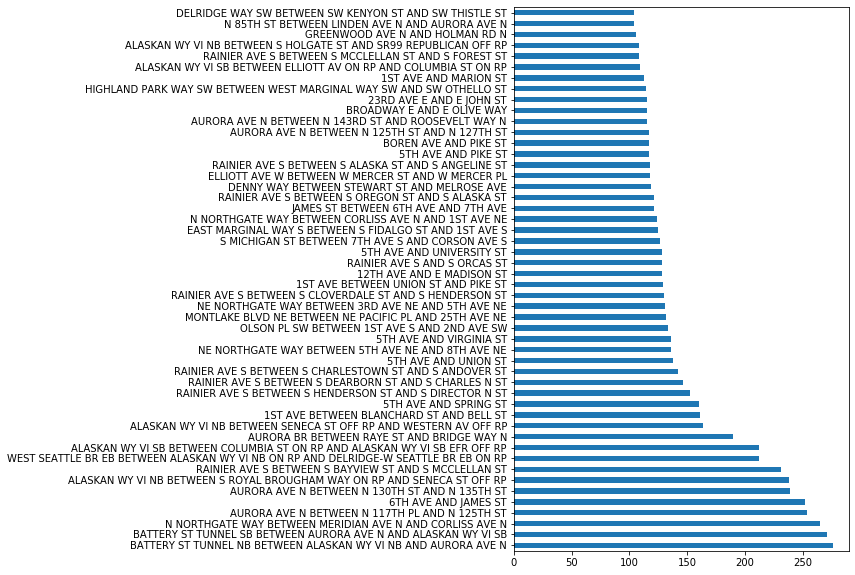

In [5]:
df['LOCATION'].value_counts().head(50).plot(kind='barh', figsize=(6,10))

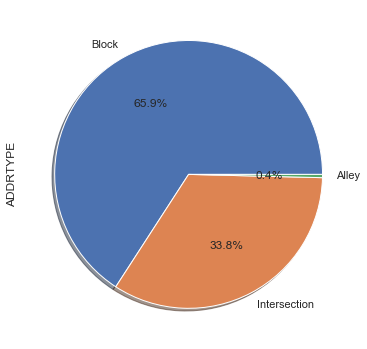

In [68]:
df['ADDRTYPE'].value_counts().head(30).plot(kind='pie',shadow=True, autopct='%1.1f%%',figsize=(6,8))

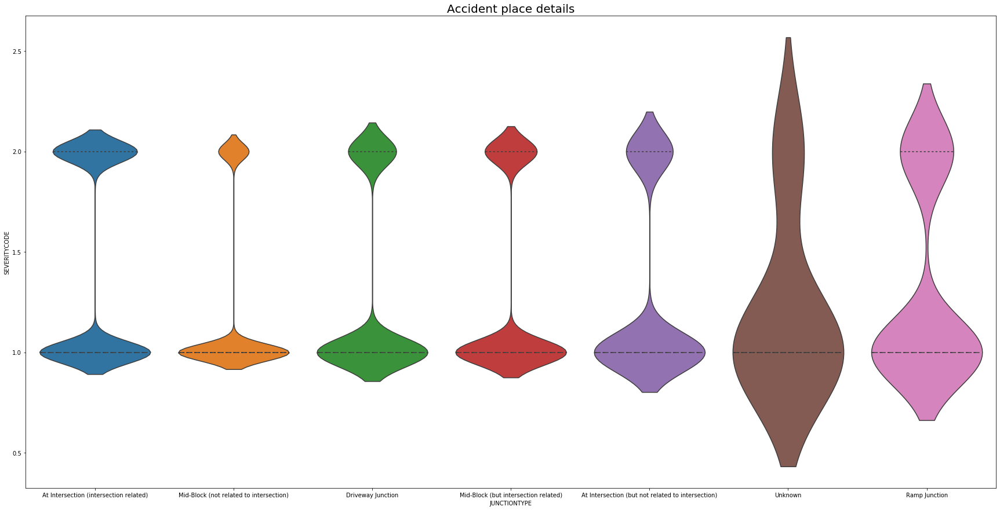

In [7]:
plt.figure(figsize=(30,15))
sns.violinplot(x='JUNCTIONTYPE',y='SEVERITYCODE', data=df, scale='width', inner='quartile')
plt.title('Accident place details', fontsize=20)
plt.show()

### Feature Selection 

In [8]:
new_df=df[["SEVERITYCODE","WEATHER","ROADCOND","LIGHTCOND"]]

In [9]:
new_df.dtypes

SEVERITYCODE     int64
WEATHER         object
ROADCOND        object
LIGHTCOND       object
dtype: object

In [10]:
new_df["SEVERITYCODE"].value_counts()

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

In [11]:
new_df["WEATHER"].value_counts()

Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [12]:
new_df["ROADCOND"].value_counts()

Dry               124510
Wet                47474
Unknown            15078
Ice                 1209
Snow/Slush          1004
Other                132
Standing Water       115
Sand/Mud/Dirt         75
Oil                   64
Name: ROADCOND, dtype: int64

In [13]:
new_df["LIGHTCOND"].value_counts()

Daylight                    116137
Dark - Street Lights On      48507
Unknown                      13473
Dusk                          5902
Dawn                          2502
Dark - No Street Lights       1537
Dark - Street Lights Off      1199
Other                          235
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

In [14]:
new_df = df.drop(columns = ['OBJECTID', 'SEVERITYCODE.1', 'REPORTNO', 'INCKEY', 'COLDETKEY', 
              'X', 'Y', 'STATUS','ADDRTYPE',
              'INTKEY', 'LOCATION', 'EXCEPTRSNCODE',
              'EXCEPTRSNDESC', 'SEVERITYDESC', 'INCDATE',
              'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE',
              'SDOT_COLDESC', 'PEDROWNOTGRNT', 'SDOTCOLNUM',
              'ST_COLCODE', 'ST_COLDESC', 'SEGLANEKEY',
              'CROSSWALKKEY', 'HITPARKEDCAR', 'PEDCOUNT', 'PEDCYLCOUNT',
              'PERSONCOUNT', 'VEHCOUNT', 'COLLISIONTYPE',
              'SPEEDING', 'UNDERINFL', 'INATTENTIONIND'])

# Label Encoding
# Convert column to category
new_df["WEATHER"] = new_df["WEATHER"].astype('category')
new_df["ROADCOND"] = new_df["ROADCOND"].astype('category')
new_df["LIGHTCOND"] = new_df["LIGHTCOND"].astype('category')

# Assign variable to new column for analysis
new_df["WEATHER_CAT"] = new_df["WEATHER"].cat.codes
new_df["ROADCOND_CAT"] = new_df["ROADCOND"].cat.codes
new_df["LIGHTCOND_CAT"] = new_df["LIGHTCOND"].cat.codes

new_df.head(5)                                                               

,SEVERITYCODE,WEATHER,ROADCOND,LIGHTCOND,WEATHER_CAT,ROADCOND_CAT,LIGHTCOND_CAT
0,2,Overcast,Wet,Daylight,4,8,5
1,1,Raining,Wet,Dark - Street Lights On,6,8,2
2,1,Overcast,Dry,Daylight,4,0,5
3,1,Clear,Dry,Daylight,1,0,5
4,2,Raining,Wet,Daylight,6,8,5


C:\Users\DEBASHRITA\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


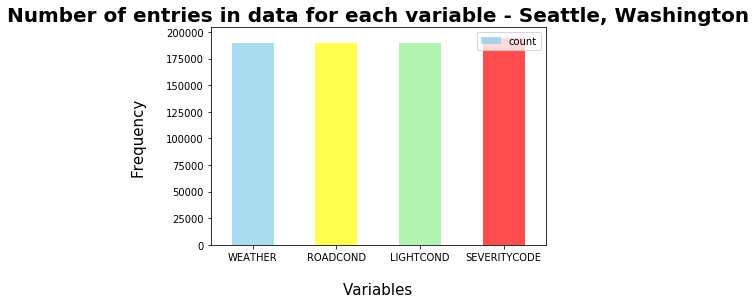

In [15]:
#Descriptive Stats
descriptive_stats= df.describe(include="all")

    #Plotting counts of selected variables
descriptive_stats_plot=descriptive_stats[["WEATHER","ROADCOND","LIGHTCOND","SEVERITYCODE"]]
descriptive_stats_plot.drop(['unique','top','freq','mean','std','min','max','25%','50%','75%'],axis=0,inplace=True)
descriptive_stats_plot=descriptive_stats_plot.transpose()

color_code=['skyblue','yellow','lightgreen','red']
descriptive_stats_plot.plot(kind='bar',alpha=0.70,color=[color_code])
plt.title('Number of entries in data for each variable - Seattle, Washington', fontsize=20, fontweight='bold')
plt.xlabel("Variables",fontsize=15,labelpad=20)
plt.ylabel("Frequency",fontsize=15,labelpad=20)
plt.xticks(rotation=360)
plt.show()


In [16]:
from sklearn.utils import resample
# Seperate majority and minority classes
new_df_majority = new_df[new_df.SEVERITYCODE==1]
new_df_minority = new_df[new_df.SEVERITYCODE==2]

#Resampling to balance 
new_df_majority_downsampled = resample(new_df_majority,
                                        replace=False,
                                        n_samples=58188,
                                        random_state=123)

# Concatenating minority class with new majority class
df_balanced = pd.concat([new_df_majority_downsampled, new_df_minority])

# Display new class counts
df_balanced.SEVERITYCODE.value_counts()

2    58188
1    58188
Name: SEVERITYCODE, dtype: int64

In [17]:
#Converting the balanced input to array
X = np.asarray(df_balanced[['WEATHER_CAT', 'ROADCOND_CAT', 'LIGHTCOND_CAT']])
X[0:5]

array([[ 6,  8,  2],
       [ 1,  0,  5],
       [10,  7,  8],
       [ 1,  0,  5],
       [ 1,  0,  5]], dtype=int8)

In [18]:
#For initializing y
y = np.asarray(df_balanced['SEVERITYCODE'])
y [0:5]

array([1, 1, 1, 1, 1], dtype=int64)

In [19]:
#Normalization of the data
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[ 1.15236718,  1.52797946, -1.21648407],
       [-0.67488   , -0.67084969,  0.42978835],
       [ 2.61416492,  1.25312582,  2.07606076],
       [-0.67488   , -0.67084969,  0.42978835],
       [-0.67488   , -0.67084969,  0.42978835]])

#### Train and Test Set ####

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (81463, 3) (81463,)
Test set: (34913, 3) (34913,)


In [21]:
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss


## K-Nearest Neighbor

The best n_neighbors was  :  3
The best accuracy was with: 0.54


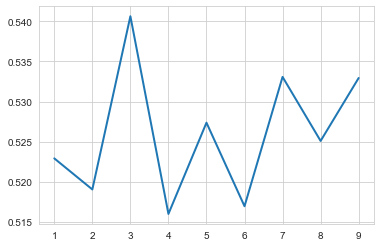

In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

# Find the best K between 1 and 10
grid_params = {'n_neighbors': [i for i in range(1, 10)]}
grid = GridSearchCV(KNeighborsClassifier(),grid_params,cv = 5)
grid_results = grid.fit(X_train, y_train)

sns.set_style("whitegrid")
sns.lineplot(grid_params['n_neighbors'], grid_results.cv_results_['mean_test_score'], palette="hls", linewidth=2)

print("The best n_neighbors was  : ", grid_results.best_params_['n_neighbors'])
print("The best accuracy was with:", grid_results.best_score_.round(2))

In [23]:
k = 3
knn = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)

knn_y_pred = knn.predict(X_test)
knn_y_pred[0:5]

array([2, 2, 1, 1, 2], dtype=int64)

In [24]:
jsc_knn = jaccard_score(y_test, knn_y_pred)
print(jsc_knn)

0.18541001622272227


In [25]:
f1_knn = f1_score(y_test, knn_y_pred, average='macro')
print(f1_knn)

0.49142508068292545


## Decision Tree ##

In [26]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion="entropy", max_depth = 5)

dtc= dt.fit(X_train,y_train)
dt_y_pred = dt.predict(X_test)

In [27]:
jsc_dt = jaccard_score(y_test, dt_y_pred)
print(jsc_dt)

0.2805633004111337


In [28]:
f1_dt = f1_score(y_test, dt_y_pred, average='macro')
print(f1_dt)

0.5409435009024848


## Logistic Regression ##

In [29]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(C=5, solver='liblinear').fit(X_train,y_train)

In [30]:
LR_y_pred = LR.predict(X_test)
LR_y_prob = LR.predict_proba(X_test)

In [31]:
LR_y_prob = LR.predict_proba(X_test)
ll_lr = log_loss(y_test, LR_y_prob)
print(ll_lr)

0.6849535354964342


In [32]:
jsc_lr = jaccard_score(y_test, LR_y_pred)
print(jsc_lr)

0.2720073907879108


In [33]:
f1_lr = f1_score(y_test, LR_y_pred, average='macro')
print(f1_lr)

0.511602093963383


## Support Vector Machine ##

In [34]:
from sklearn.svm import SVC
clf = SVC(kernel='rbf')
SVM_clf = clf.fit(X_train, y_train)
SVM_y_pred=clf.predict(X_test)

In [35]:
jsc_svm = jaccard_score(y_test, SVM_y_pred)
print(jsc_svm)

0.2791151284490961


In [36]:
f1_svm= f1_score(y_test, SVM_y_pred, average='macro')
print(f1_svm)

0.5417615592957363


### Classification Report and Confusion Matrix ###

In [37]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix 

* K-NEAREST NEIGHBOR

In [38]:
print (classification_report(y_test, knn_y_pred))

              precision    recall  f1-score   support

           1       0.68      0.20      0.31     17409
           2       0.53      0.90      0.67     17504

    accuracy                           0.55     34913
   macro avg       0.60      0.55      0.49     34913
weighted avg       0.60      0.55      0.49     34913



Confusion matrix, without normalization
[[ 3543 13866]
 [ 1700 15804]]
Normalized confusion matrix
[[0.20351542 0.79648458]
 [0.09712066 0.90287934]]


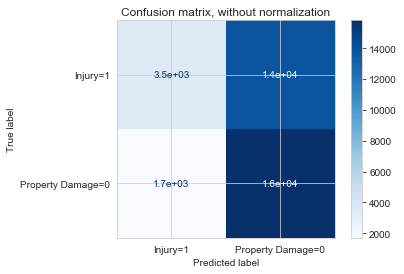

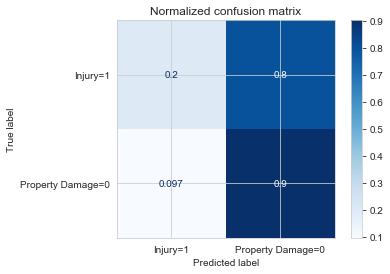

In [39]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(knn, X_test, y_test,
                                 display_labels=['Injury=1','Property Damage=0'],
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

* DECISION TREE

In [40]:
print (classification_report(y_test, dt_y_pred))

              precision    recall  f1-score   support

           1       0.61      0.34      0.44     17409
           2       0.55      0.79      0.64     17504

    accuracy                           0.56     34913
   macro avg       0.58      0.56      0.54     34913
weighted avg       0.58      0.56      0.54     34913



Confusion matrix, without normalization
[[ 5937 11472]
 [ 3752 13752]]
Normalized confusion matrix
[[0.3410305  0.6589695 ]
 [0.21435101 0.78564899]]


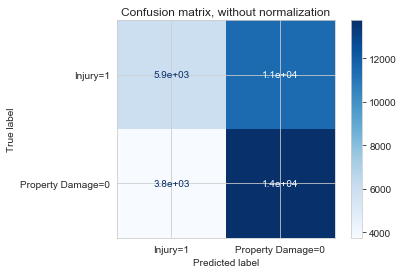

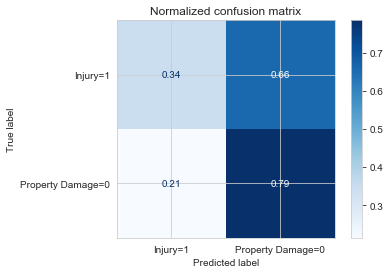

In [41]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(dtc, X_test, y_test,
                                 display_labels=['Injury=1','Property Damage=0'],
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

* LOGISTIC REGRESSION

In [42]:
print (classification_report(y_test, LR_y_pred))

              precision    recall  f1-score   support

           1       0.54      0.36      0.43     17409
           2       0.52      0.70      0.60     17504

    accuracy                           0.53     34913
   macro avg       0.53      0.53      0.51     34913
weighted avg       0.53      0.53      0.51     34913



Confusion matrix, without normalization
[[ 6183 11226]
 [ 5322 12182]]
Normalized confusion matrix
[[0.35516112 0.64483888]
 [0.30404479 0.69595521]]


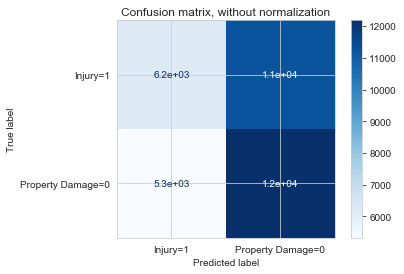

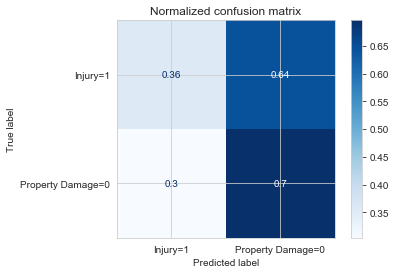

In [43]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(LR, X_test, y_test,
                                 display_labels=['Injury=1','Property Damage=0'],
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

* SUPPORT VECTOR MACHINE

In [44]:
print (classification_report(y_test, SVM_y_pred))

              precision    recall  f1-score   support

           1       0.62      0.34      0.44     17409
           2       0.55      0.79      0.65     17504

    accuracy                           0.57     34913
   macro avg       0.58      0.57      0.54     34913
weighted avg       0.58      0.57      0.54     34913



Confusion matrix, without normalization
[[ 5867 11542]
 [ 3611 13893]]
Normalized confusion matrix
[[0.33700959 0.66299041]
 [0.2062957  0.7937043 ]]


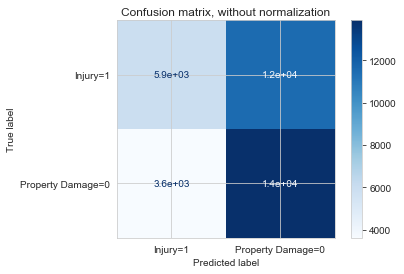

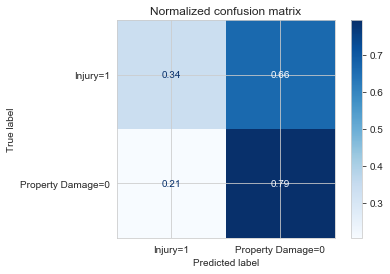

In [45]:
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(SVM_clf, X_test, y_test,
                                 display_labels=['Injury=1','Property Damage=0'],
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

### Accuracy Score ###

In [46]:
from sklearn.metrics import accuracy_score
print("K-Nearest Accuracy is: ", accuracy_score(y_test, knn_y_pred))
print("Decision Tree Accuracy is: ", accuracy_score(y_test, dt_y_pred))
print("Logistic Regression Accuracy is: ", accuracy_score(y_test, LR_y_pred))
print("Support Vector Machine Accuracy is: ", accuracy_score(y_test, SVM_y_pred))

K-Nearest Accuracy is:  0.554148884369719
Decision Tree Accuracy is:  0.5639446624466531
Logistic Regression Accuracy is:  0.5260218256809784
Support Vector Machine Accuracy is:  0.5659782888895254


### Jaccard Score, F1-Score, Log Loss Score ###

In [47]:
Jaccard = [jsc_knn,jsc_dt,jsc_svm,jsc_lr]
F1_score = [f1_knn,f1_dt,f1_svm,f1_lr]
LogLoss = ['NA','NA','NA',ll_lr]

    
df = {'Algorithm': ['KNN', 'Decistion Tree', 'SVM', 'LogisticRegression'], \
     'Jaccard': Jaccard, 'F1-score': F1_score, 'LogLoss': LogLoss}

Report = pd.DataFrame(data=df, columns=['Algorithm', 'Jaccard', 'F1-score', 'LogLoss'], index=None)
Report

,Algorithm,Jaccard,F1-score,LogLoss
0,KNN,0.185410,0.491425,NA
1,Decistion Tree,0.280563,0.540944,NA
2,SVM,0.279115,0.541762,NA
3,LogisticRegression,0.272007,0.511602,0.684954


#### Plots and Maps ####

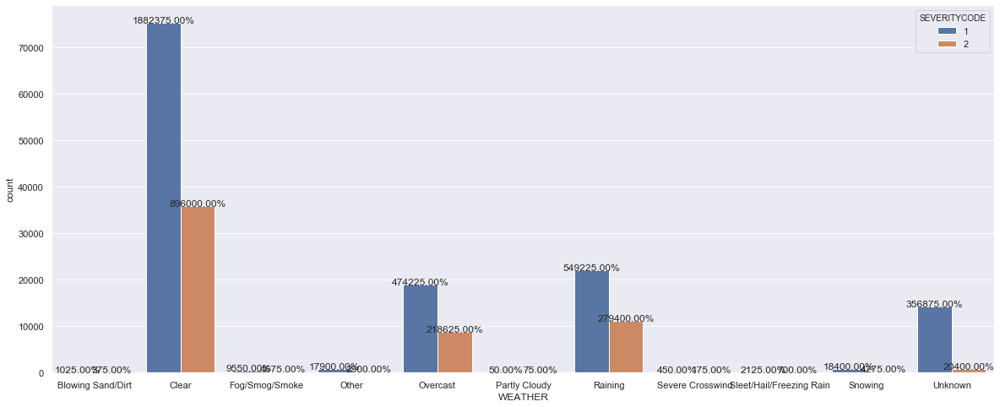

In [48]:
plt.figure(figsize=(20,8))
sns.set(style="darkgrid")

total = float(len(df))  

ax = sns.countplot(x="WEATHER", hue="SEVERITYCODE", data=new_df) # for Seaborn version 0.7 and more
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2%}'.format(height/total),
            ha="center") 
show()

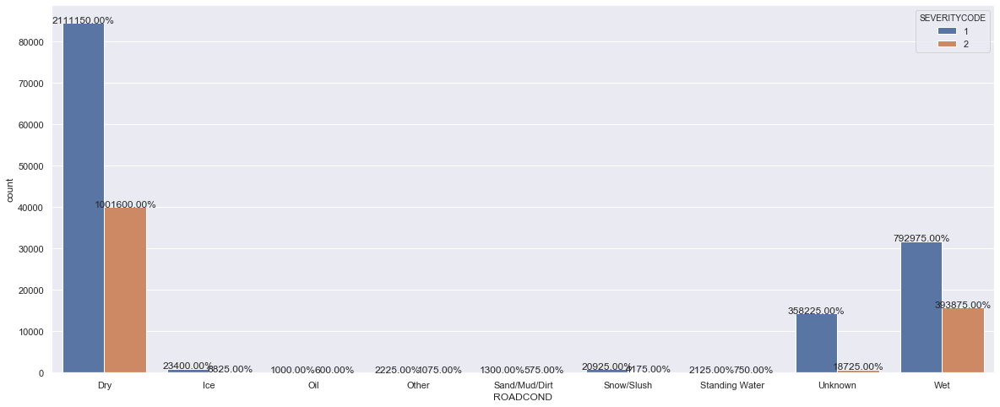

In [49]:
plt.figure(figsize=(20,8))
sns.set(style="darkgrid")

total = float(len(df)) 

ax = sns.countplot(x="ROADCOND", hue="SEVERITYCODE", data=new_df) # for Seaborn version 0.7 and more
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2%}'.format(height/total),
            ha="center") 
show()

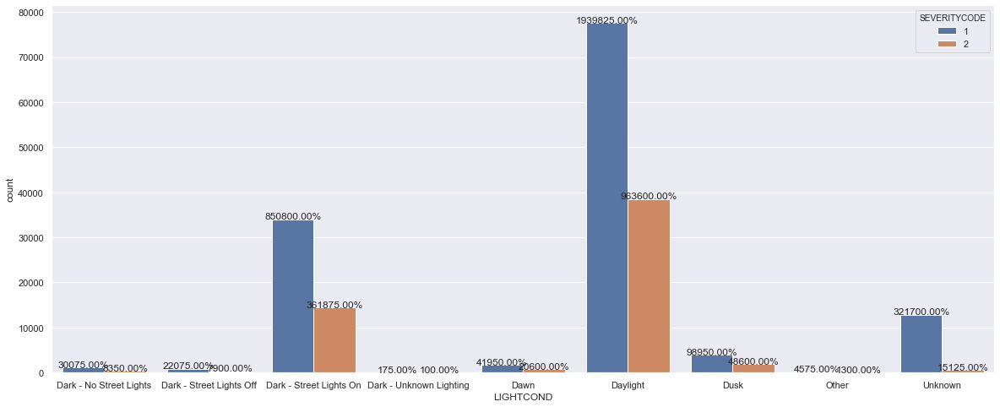

In [50]:
plt.figure(figsize=(20,8))
sns.set(style="darkgrid")
total = float(len(df)) 
ax = sns.countplot(x="LIGHTCOND", hue="SEVERITYCODE", data=new_df) # for Seaborn version 0.7 and more
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2%}'.format(height/total),
            ha="center") 
show()

In [51]:
df_all = pd.read_csv('Data-Collisions.csv')
df_map = df_all[['SEVERITYCODE','ADDRTYPE','X', 'Y']]
df_map["geo"] = df_map["Y"].map(str) + "," + df_map["X"].map(str)
df_map.head()

C:\Users\DEBASHRITA\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\DEBASHRITA\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,SEVERITYCODE,ADDRTYPE,X,Y,geo
0,2,Intersection,-122.323148,47.703140,"47.70314032,-122.32314840000002"
1,1,Block,-122.347294,47.647172,"47.64717249,-122.3472943"
2,1,Block,-122.334540,47.607871,"47.60787143,-122.33453999999999"
3,1,Block,-122.334803,47.604803,"47.60480289,-122.3348033"
4,2,Intersection,-122.306426,47.545739,"47.54573946,-122.3064263"


In [62]:
# Create basic Folium Seattle map
accident_map = folium.Map(location=[47.61536892, -122.3302243], 
                       tiles = "OpenStreetMap",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = df_map[df_map['SEVERITYCODE']==2]
data_heatmap = df_map[['Y','X']]
data_heatmap = df_map.dropna(axis=0, subset=['Y','X'])
data_heatmap = [[row['Y'],row['X']] for index, row in data_heatmap.head(10000).iterrows()] 

HeatMap(data_heatmap, radius=10).add_to(accident_map)

# Plot!
accident_map

In [53]:
data=df_map.dropna(subset=['X'])
data=df_map.dropna(subset=['Y'])

from folium import plugins

df_map_accident = df_map[df_map['SEVERITYCODE']==1]
# Make reduced df by selecting every 50th record
reduced_df = data.iloc [0::10, 0:]

seattle_map = folium.Map(location=[47.61536892, -122.3302243], zoom_start=10)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(reduced_df.Y, reduced_df.X, reduced_df.SEVERITYCODE):
    folium.Marker(
    location=[lat, lng],
    icon=None,
    popup=label,
    ).add_to(incidents)

seattle_map.add_child(incidents)

# display map
seattle_map


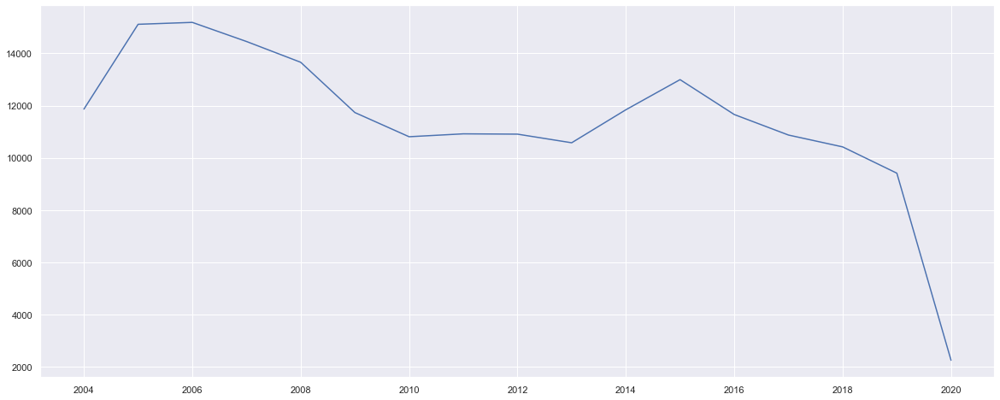

In [58]:
plt.figure(figsize=(20,8))
df_all['year'] = pd.DatetimeIndex(df_all['INCDATE']).year
date=df_all['year']
plt.plot(date.value_counts().head(20).sort_index())